# Dataset Biomarcadores: Predicción MMSE

## Índice

  
**1. Carga de los datos**  

**2. Preprocesado de los datos**

**3. Selección de variables**
   
**4. Aplicación de los modelos de Machine Learning** 

    4.1. Decision Tree
    4.2. Random Forest
    4.3. SVM
    4.4. KNN
    4.5. Ridge Regression
    4.6. XGBoost
    4.7. CatBoost

**5. Interpretabilidad de los modelos** 

In [23]:
# Importaciones
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import shapiro
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.feature_selection import VarianceThreshold
from skrebate import ReliefF
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, mean_absolute_error, r2_score
from sklearn.inspection import permutation_importance
pd.set_option('display.max_columns', None)
%matplotlib inline

## 1. Cargar los datos

In [2]:
# Cargar el archivo CSV
archivo_csv = './Datos/GSE29676_processed.csv'
df = pd.read_csv(archivo_csv)
#pd.set_option('display.max_columns', None)

df.head()

/var/folders/0b/vqcfbgmd5p52qzyll4bsk5b80000gn/T/ipykernel_8026/2199550652.py:3: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(archivo_csv)


Sample_ID Sample_geo_accession  \
0  Alzheimer's Disease serum (PD vs. AD) sample 1            GSM734833   
1  Alzheimer's Disease serum (PD vs. AD) sample 2            GSM734834   
2  Alzheimer's Disease serum (PD vs. AD) sample 3            GSM734835   
3  Alzheimer's Disease serum (PD vs. AD) sample 4            GSM734836   
4  Alzheimer's Disease serum (PD vs. AD) sample 5            GSM734837   

  Sample_age Sample_gender  Sample_mmse     Sample_diagnosis            1  \
0        UNK        Female          5.0  Alzheimer's Disease  7289.964133   
1        UNK        Female          8.0  Alzheimer's Disease   938.445406   
2         94          Male          8.0  Alzheimer's Disease   341.021574   
3         83        Female         11.0  Alzheimer's Disease   895.008306   
4        UNK          Male         12.0  Alzheimer's Disease   789.470167   

             2           3            4            5            6           7  \
0  2388.467919  747.362250  4584.640077  4023.209190  1866.587224  481.421303   
1  6746.887199  426.744667   879.025263  1986.400664  2042.383278  461.119956   
2   221.883908  181.105244   742.411562  1023.864303   837.161987  257.865082   
3  1033.330868  349.894758  1635.340642  1127.703651  2225.766753  455.851204   
4   944.010349  172.624672   589.225547  1113.346932  1487.531459  272.253768   

            8            9          10           11           12  \
0  586.888482  1310.611536  595.525880  1171.503964  1382.892922   
1  634.469631  1739.880730  842.685671   695.854077   677.684281   
2  325.029941   803.179767  194.698132   417.381621   480.948362   
3  493.327760  1385.610498  556.015818   765.203142   693.316293   
4  321.903912   872.658818  819.391776   408.380653   546.809199   

             13           14           15           16           17        18  \
0  13897.573800  1860.222826   389.137522   641.895071  1007.393397 -1.363800   
1   1375.993735  2453.413527   360.940541  1550.325561   945.811540 -0.491076   
2    823.968890   993.879991   128.732646   171.510264   698.034780 -2.398745   
3   3099.992605  1953.891371  7647.261678   176.139815  1754.584231 -3.066264   
4   2265.822123  1802.530385   251.538808   244.962630   458.359605 -2.301662   

            19           20           21          22          23        24  \
0  1151.046968  5111.521371  1852.040027  730.087453  761.000247 -1.363800   
1   934.025726  5237.811985  1870.997906  380.092488  356.029785 -1.964302   
2   419.780366  5814.957548  1056.247359  229.080143  399.790825 -0.399791   
3   697.745341  6423.481764   967.917243  294.702012  343.080839 -4.769744   
4   612.242170  5296.124937   775.660193  206.491989  228.850994 -3.288089   

           25           26           27        28           29           30  \
0  622.347275  1177.868363  2582.582080  1.818400  1086.039181   931.929812   
1  356.029785   809.292532  2192.161326  1.473227  1376.484811   889.337850   
2  169.111519   604.483727   444.567397  0.799582   758.403195  2928.068002   
3  343.080839   445.971021  1197.205628 -1.362784  2768.154733   880.699075   
4  222.932434  1079.479616  5560.158483  0.657618  1083.425322   718.776253   

           31          32        33          34        35          36  \
0   -2.273000  685.082062 -3.636799  890.561221 -2.727599  935.112012   
1  158.126332  677.684281 -3.437529  515.629344 -1.964302  538.709896   
2   -0.799582  281.052950 -2.398745  392.594590 -2.798536  504.136230   
3   -2.725568  381.920179 -5.451135  451.081460 -7.495311  752.938087   
4   -1.315236  239.044070 -1.644044  273.240195 -0.657618  333.741033   

            37           38          39           40           41          42  \
0  2149.348367  2306.639936  791.003841  6942.195203   789.640041  523.699095   
1   165.001390   691.434397  928.623895   864.784071   758.711749  432.637573   
2  1076.236901   419.780366  852.753830   537.718659   385.798146  297.044583   
3  1743.000568  1272.840133  922.604679  1

## 2. Preprocesamiento de los datos

In [3]:
# Reemplazar "UNK" con NaN en la columna Sample_age
df["Sample_age"] = df["Sample_age"].replace("UNK", np.nan)

In [4]:
df.describe()

Sample_mmse             1             2             3             4  \
count     350.0000    609.000000    609.000000    609.000000    609.000000   
mean       16.5200   4583.267636   4050.527725   2457.130826   3166.712128   
std         5.3826   8472.466602   6299.759053   2572.270194   3021.656035   
min         2.0000     -0.696199     -0.637979    105.481529    265.895288   
25%        13.0000    848.243411   1141.490604    652.638911   1170.555131   
50%        18.0000   1830.302820   2251.975736   1699.546166   2161.575544   
75%        20.0000   3544.044081   4013.246606   3461.257725   4061.564016   
max        24.0000  37253.609210  33907.862840  21191.898240  23094.034830   

                  5             6              7             8             9  \
count    609.000000    609.000000     609.000000    609.000000    609.000000   
mean    5560.026350   6429.672828   19904.306058  13942.954158  16503.364960   
std     9742.164870   7921.520468   30388.575215  21813.798297  26664.186929   
min      -12.565150     -0.661485     118.161769    172.324449    310.140902   
25%      801.144360   1627.831651     730.393977    862.882243   1469.910965   
50%     1766.057696   2921.963517    3141.520455   2608.657034   2738.977413   
75%     4388.578171   8867.897180   15976.871890   9323.842786   7569.778548   
max    45315.140250  37359.604210  106556.841000  77380.348270  98248.649850   

                  10            11            12            13             14  \
count     609.000000    609.000000    609.000000    609.000000     609.000000   
mean    24450.079896  11957.476557   2949.095992   8383.486735   16699.729375   
std     30020.919388  21995.336675   2886.102685  15897.409709   26661.395917   
min        95.568094    268.807767    265.891227    289.950931     424.051932   
25%      1046.949738    987.874001   1037.922773   1624.952606    1936.059543   
50%      4271.631366   2360.649709   2001.685258   2737.196155    3125.547365   
75%     54466.290410   8036.208564   3888.803086   5558.164824    8587.946992   
max    100619.335400  94810.022690  21534.097390  76054.307390  112110.743800   

                 15             16            17             18            19  \
count    609.000000     609.000000    609.000000     609.000000    609.000000   
mean    9441.109216   11571.694626  18198.843636   15322.541294  17087.733828   
std    19428.637919   24088.534724  26848.456165   25318.449040  26380.994398   
min      -10.949271      67.521011     -2.725721      -7.389024    245.475447   
25%      524.452001     780.874453   1059.456999     195.382156   1203.842681   
50%     1905.644092    2129.274302   2772.582041    2555.756381   2874.624251   
75%     4375.577198    5728.626921  31008.607540    9307.492651  11165.575440   
max    82544.514810  105661.826500  97855.197320  102955.557400  94059.109530   

                 20            21            22            23            24  \
count    609.000000    609.000000    609.000000    609.000000    609.000000   
mean    4759.283806  16728.623850   9740.379774  10669.928684   2989.301784   
std     3269.795800  25203.788946  19734.392366  20759.415314   3496.851220   
min      347.091164    405.698513    -11.995128     67.246108     -7.389024   
25%     1988.596024   1605.991825    402.267829    761.000247    808.383330   
50%     3906.472971   3299.932200   1757.745295   2639.405447   2000.388696   
75%     7327.448452  14966.477410   6920.259630  10202.103500   3886.169089   
max    25349.849430  95016.042510  92975.143600  99804.073240  24867.268500   

                 25            26            27            28             29  \
count    609.000000    609.000000    609.000000    609.000000     609.000000   
mean   21983.016706  14171.002622   3623.023302   9619.661165   13113.835514   
std    29833.276277  21026.211080   5192.724797  19417.608875   25679.905995   
min       58.023246    110.841856    295.629644    -93.248791     276.823312   
25%      53

In [5]:
unique_values_count = df['Sample_ID'].nunique()
print(unique_values_count)

609


In [6]:
df.shape

(609, 9486)

In [7]:
mapping_diagnosis = {"Older Control": 0, "Younger Control": 1, "Alzheimer's Disease": 2, "Breast Cancer": 3, "Parkinson's Disease": 4}  
df["Sample_diagnosis"] = df["Sample_diagnosis"].map(mapping_diagnosis)

In [8]:
mapping_gender = {"Male": 0, "Female": 1}  
df["Sample_gender"] = df["Sample_gender"].map(mapping_gender)

In [9]:
df['Sample_age'] = pd.to_numeric(df['Sample_age'], errors='coerce').astype('Int64')
df['Sample_gender'] = df['Sample_gender'].astype('Int64')

In [10]:
df.head()

Sample_ID Sample_geo_accession  \
0  Alzheimer's Disease serum (PD vs. AD) sample 1            GSM734833   
1  Alzheimer's Disease serum (PD vs. AD) sample 2            GSM734834   
2  Alzheimer's Disease serum (PD vs. AD) sample 3            GSM734835   
3  Alzheimer's Disease serum (PD vs. AD) sample 4            GSM734836   
4  Alzheimer's Disease serum (PD vs. AD) sample 5            GSM734837   

   Sample_age  Sample_gender  Sample_mmse  Sample_diagnosis            1  \
0        <NA>              1          5.0                 2  7289.964133   
1        <NA>              1          8.0                 2   938.445406   
2          94              0          8.0                 2   341.021574   
3          83              1         11.0                 2   895.008306   
4        <NA>              0         12.0                 2   789.470167   

             2           3            4            5            6           7  \
0  2388.467919  747.362250  4584.640077  4023.209190  1866.587224  481.421303   
1  6746.887199  426.744667   879.025263  1986.400664  2042.383278  461.119956   
2   221.883908  181.105244   742.411562  1023.864303   837.161987  257.865082   
3  1033.330868  349.894758  1635.340642  1127.703651  2225.766753  455.851204   
4   944.010349  172.624672   589.225547  1113.346932  1487.531459  272.253768   

            8            9          10           11           12  \
0  586.888482  1310.611536  595.525880  1171.503964  1382.892922   
1  634.469631  1739.880730  842.685671   695.854077   677.684281   
2  325.029941   803.179767  194.698132   417.381621   480.948362   
3  493.327760  1385.610498  556.015818   765.203142   693.316293   
4  321.903912   872.658818  819.391776   408.380653   546.809199   

             13           14           15           16           17        18  \
0  13897.573800  1860.222826   389.137522   641.895071  1007.393397 -1.363800   
1   1375.993735  2453.413527   360.940541  1550.325561   945.811540 -0.491076   
2    823.968890   993.879991   128.732646   171.510264   698.034780 -2.398745   
3   3099.992605  1953.891371  7647.261678   176.139815  1754.584231 -3.066264   
4   2265.822123  1802.530385   251.538808   244.962630   458.359605 -2.301662   

            19           20           21          22          23        24  \
0  1151.046968  5111.521371  1852.040027  730.087453  761.000247 -1.363800   
1   934.025726  5237.811985  1870.997906  380.092488  356.029785 -1.964302   
2   419.780366  5814.957548  1056.247359  229.080143  399.790825 -0.399791   
3   697.745341  6423.481764   967.917243  294.702012  343.080839 -4.769744   
4   612.242170  5296.124937   775.660193  206.491989  228.850994 -3.288089   

           25           26           27        28           29           30  \
0  622.347275  1177.868363  2582.582080  1.818400  1086.039181   931.929812   
1  356.029785   809.292532  2192.161326  1.473227  1376.484811   889.337850   
2  169.111519   604.483727   444.567397  0.799582   758.403195  2928.068002   
3  343.080839   445.971021  1197.205628 -1.362784  2768.154733   880.699075   
4  222.932434  1079.479616  5560.158483  0.657618  1083.425322   718.776253   

           31          32        33          34        35          36  \
0   -2.273000  685.082062 -3.636799  890.561221 -2.727599  935.112012   
1  158.126332  677.684281 -3.437529  515.629344 -1.964302  538.709896   
2   -0.799582  281.052950 -2.398745  392.594590 -2.798536  504.136230   
3   -2.725568  381.920179 -5.451135  451.081460 -7.495311  752.938087   
4   -1.315236  239.044070 -1.644044  273.240195 -0.657618  333.741033   

            37           38          39           40           41          42  \
0  2149.348367  2306.639936  791.003841  6942.195203   789.640041  523.699095   
1   165.001390   691.434397  928.623895   864.784071   758.711749  432.637573   
2  1076.236901   419.780366  852.753830   537.718659   385.798146  297.044583   
3  1743.000568  1272.840133  922.604679  1377.43

### Filtrar solo los pacientes con Alzheimer

In [11]:
df_mmse = df[df['Sample_diagnosis'] == 2]
print(df_mmse.shape)
df_mmse.head()

(350, 9486)


Sample_ID Sample_geo_accession  \
0  Alzheimer's Disease serum (PD vs. AD) sample 1            GSM734833   
1  Alzheimer's Disease serum (PD vs. AD) sample 2            GSM734834   
2  Alzheimer's Disease serum (PD vs. AD) sample 3            GSM734835   
3  Alzheimer's Disease serum (PD vs. AD) sample 4            GSM734836   
4  Alzheimer's Disease serum (PD vs. AD) sample 5            GSM734837   

   Sample_age  Sample_gender  Sample_mmse  Sample_diagnosis            1  \
0        <NA>              1          5.0                 2  7289.964133   
1        <NA>              1          8.0                 2   938.445406   
2          94              0          8.0                 2   341.021574   
3          83              1         11.0                 2   895.008306   
4        <NA>              0         12.0                 2   789.470167   

             2           3            4            5            6           7  \
0  2388.467919  747.362250  4584.640077  4023.209190  1866.587224  481.421303   
1  6746.887199  426.744667   879.025263  1986.400664  2042.383278  461.119956   
2   221.883908  181.105244   742.411562  1023.864303   837.161987  257.865082   
3  1033.330868  349.894758  1635.340642  1127.703651  2225.766753  455.851204   
4   944.010349  172.624672   589.225547  1113.346932  1487.531459  272.253768   

            8            9          10           11           12  \
0  586.888482  1310.611536  595.525880  1171.503964  1382.892922   
1  634.469631  1739.880730  842.685671   695.854077   677.684281   
2  325.029941   803.179767  194.698132   417.381621   480.948362   
3  493.327760  1385.610498  556.015818   765.203142   693.316293   
4  321.903912   872.658818  819.391776   408.380653   546.809199   

             13           14           15           16           17        18  \
0  13897.573800  1860.222826   389.137522   641.895071  1007.393397 -1.363800   
1   1375.993735  2453.413527   360.940541  1550.325561   945.811540 -0.491076   
2    823.968890   993.879991   128.732646   171.510264   698.034780 -2.398745   
3   3099.992605  1953.891371  7647.261678   176.139815  1754.584231 -3.066264   
4   2265.822123  1802.530385   251.538808   244.962630   458.359605 -2.301662   

            19           20           21          22          23        24  \
0  1151.046968  5111.521371  1852.040027  730.087453  761.000247 -1.363800   
1   934.025726  5237.811985  1870.997906  380.092488  356.029785 -1.964302   
2   419.780366  5814.957548  1056.247359  229.080143  399.790825 -0.399791   
3   697.745341  6423.481764   967.917243  294.702012  343.080839 -4.769744   
4   612.242170  5296.124937   775.660193  206.491989  228.850994 -3.288089   

           25           26           27        28           29           30  \
0  622.347275  1177.868363  2582.582080  1.818400  1086.039181   931.929812   
1  356.029785   809.292532  2192.161326  1.473227  1376.484811   889.337850   
2  169.111519   604.483727   444.567397  0.799582   758.403195  2928.068002   
3  343.080839   445.971021  1197.205628 -1.362784  2768.154733   880.699075   
4  222.932434  1079.479616  5560.158483  0.657618  1083.425322   718.776253   

           31          32        33          34        35          36  \
0   -2.273000  685.082062 -3.636799  890.561221 -2.727599  935.112012   
1  158.126332  677.684281 -3.437529  515.629344 -1.964302  538.709896   
2   -0.799582  281.052950 -2.398745  392.594590 -2.798536  504.136230   
3   -2.725568  381.920179 -5.451135  451.081460 -7.495311  752.938087   
4   -1.315236  239.044070 -1.644044  273.240195 -0.657618  333.741033   

            37           38          39           40           41          42  \
0  2149.348367  2306.639936  791.003841  6942.195203   789.640041  523.699095   
1   165.001390   691.434397  928.623895   864.784071   758.711749  432.637573   
2  1076.236901   419.780366  852.753830   537.718659   385.798146  297.044583   
3  1743.000568  1272.840133  922.604679  1377.43

In [12]:
# Separar variables (X) y etiquetas (y)
X = df_mmse.drop(columns=['Sample_diagnosis', 'Sample_ID', 'Sample_geo_accession', 'Sample_age', 'Sample_gender', 'Sample_mmse'])  # o el nombre de la columna de salida
y = df_mmse['Sample_mmse']

# Estandarizar las variables
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

In [13]:
print(X.shape)
print(X_scaled.shape)

(350, 9480)
(350, 9480)


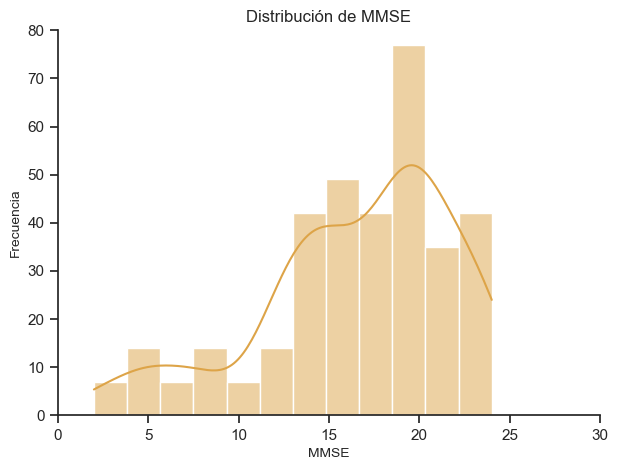

In [110]:
plt.figure(figsize=(7, 5))
sns.set_style("ticks")
sns.histplot(df_mmse['Sample_mmse'].dropna(), kde=True, color='#DDA448')

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)

plt.title(f'Distribución de MMSE')
plt.xlabel('MMSE', fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.xlim(0, 30)
plt.ylim(0, 80)
plt.grid(False)

# Guardar como PNG
plt.savefig("./Figuras/mmse_dist.png", dpi=500)

plt.show()

### Eliminar las variables con varianza próxima a cero

In [14]:
selector = VarianceThreshold(threshold=0.01)
X_var = selector.fit_transform(X_scaled)

# Mantener los nombres de las columnas
selected_columns_var = X_scaled.columns[selector.get_support()]
X_var_df = pd.DataFrame(X_var, columns=selected_columns_var)

In [15]:
X_var_df.shape

(350, 9480)

### Eliminar las variables con alta correlación

In [16]:
# Correlación de Spearman
corr_matrix = X_var_df.corr(method='spearman').abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Eliminar una variable de cada par con correlación > 0.80
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.80)]
X_uncorrelated = X_var_df.drop(columns=to_drop)

In [17]:
X_uncorrelated.shape

(350, 7475)

### Aplicar reliefF

In [18]:
relief = ReliefF(n_neighbors=10)
relief.fit(X_uncorrelated.values, y.values)

# Ordenar por puntuación de importancia
relief_scores = pd.Series(relief.feature_importances_, index=X_uncorrelated.columns)
top_relief_features = relief_scores.sort_values(ascending=False)

In [19]:
# Seleccionar las 500 más importantes
X_relief_selected = X_uncorrelated[top_relief_features.head(500).index]

In [20]:
X_relief_selected.shape

(350, 500)

In [21]:
X_relief_selected.columns

Index(['6', '8322', '8325', '4052', '9217', '8586', '5', '7364', '7', '6986',
       ...
       '8214', '3615', '8519', '5647', '9458', '3321', '9043', '9269', '8430',
       '5148'],
      dtype='object', length=500)

### Determinación del nº óptimo de variables y selección

In [159]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
cv = StratifiedKFold(n_splits=5)

rfecv = RFECV(estimator=model, step=1, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
rfecv.fit(X_relief_selected, y)

X_final = X_relief_selected.loc[:, rfecv.support_]

print(f"Número óptimo de variables: {X_final.shape[1]}")
print("Variables seleccionadas:", X_final.columns)

python(14694) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(14695) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(14696) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(14697) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(14698) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(14699) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(14700) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(14701) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Número óptimo de variables: 29
Variables seleccionadas: Index(['8322', '9217', '8586', '5', '8172', '8965', '8838', '7903', '7268',
       '8232', '8086', '8399', '8222', '7816', '7227', '8065', '114', '8837',
       '9026', '7854', '8426', '8050', '6150', '5395', '767', '8738', '1335',
       '8915', '8339'],
      dtype='object')


In [160]:
# Modelos de regresión
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, random_state=42)
}

# Evaluación por validación cruzada
for name, model in models.items():
    scores = cross_val_score(model, X_final, y, cv=5, scoring='neg_mean_squared_error')
    mse_scores = -scores
    rmse_scores = np.sqrt(mse_scores)
    print(f"{name} - RMSE medio: {rmse_scores.mean():.4f} ± {rmse_scores.std():.4f}")

Linear Regression - RMSE medio: 4.4561 ± 0.6013
Random Forest - RMSE medio: 3.5245 ± 1.0938
XGBoost - RMSE medio: 3.6214 ± 1.4694


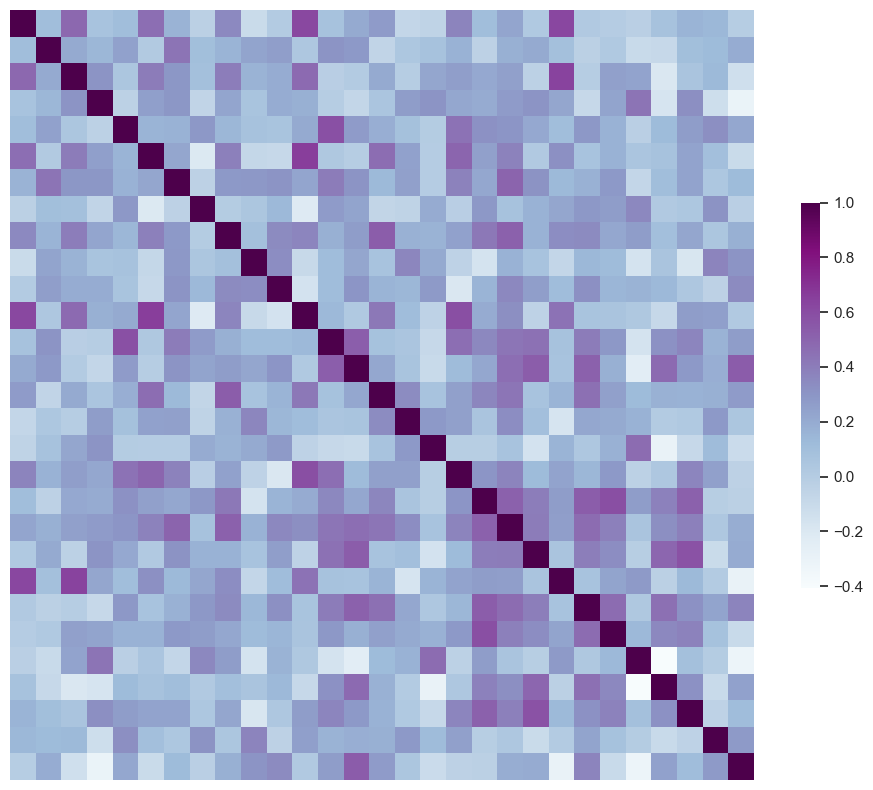

In [161]:
# Crear la máscara para la mitad inferior
#mask = np.tril(np.ones_like(corr, dtype=bool))

# Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    X_final.corr(method='spearman'),
    cmap='BuPu',
    #mask=mask,
    #vmin=-1, vmax=1,
    cbar_kws={"shrink": .5},
    xticklabels=False,
    yticklabels=False
)

# Guardar como PNG
plt.savefig("./Figuras/correlaciones_mmse.png", dpi=500, bbox_inches='tight')
plt.show()

## 4. Aplicación de los modelos de Machine Learning

In [162]:
# Dividir en entrenamiento y test (test = 25%)
X_train, X_test, y_train, y_test = train_test_split(X_final, y, random_state=42)

In [163]:
# Inicializar dataframe de resultados
mmse_results_df = pd.DataFrame(columns=["ID", "Modelo", "MSE", "RMSE", "MAE", "R2", "RMSE relativo"])

### 4.1. Decision Tree

In [164]:
# Modelo base de regresión
dt_model = DecisionTreeRegressor()

# Parámetros
parameters = {'max_depth': [3, 4, 5, 6, 7, 12, None]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(dt_model, param_grid=parameters, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Guardar el mejor modelo
dt_best_model = grid_search.best_estimator_

# Evaluar el modelo
y_pred = dt_best_model.predict(X_test)
y_pred = np.clip(np.round(dt_best_model.predict(X_test)), 1, 30)


# Métricas de evaluación
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse_relative = rmse / (y_test.max() - y_test.min())

# Resultados
print(f"Mejor parámetro: {grid_search.best_params_}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Relative RMSE: {rmse_relative:.4f}")

Mejor parámetro: {'max_depth': 3}
MAE: 3.5000
MSE: 20.2727
RMSE: 4.5025
R²: 0.2777
Relative RMSE: 0.2047


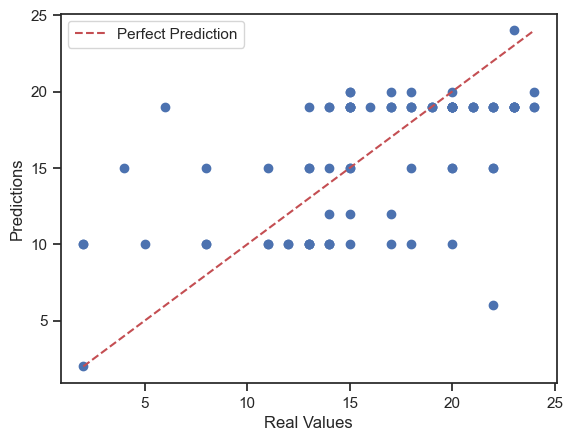

In [165]:
# Comparar valores reales vs predicciones
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', label="Perfect Prediction")
plt.xlabel("Real Values")
plt.ylabel("Predictions")
plt.legend()
plt.show()

In [166]:
# Añadir fila al DataFrame
mmse_results_df = pd.concat([mmse_results_df, pd.DataFrame({
        "ID": 1,
        "Modelo": "Decision Tree",
        "MSE": [round(mse, 3)],
        "RMSE": [round(rmse, 3)],
        "MAE": [round(mae, 3)],
        "R2": [round(r2, 3)],
        "RMSE relativo": [round(rmse_relative, 3)]
    })], ignore_index=True)

In [167]:
mmse_results_df

,ID,Modelo,MSE,RMSE,MAE,R2,RMSE relativo
0,1,Decision Tree,20.273,4.503,3.5,0.278,0.205


### 4.2. Random Forest

In [168]:
# Modelo base de regresión
rf_model = RandomForestRegressor()

# Parámetros
parameters = {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 7, 12, None]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(rf_model, param_grid=parameters, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Guardar el mejor modelo
rf_best_model = grid_search.best_estimator_

# Evaluar el modelo
y_pred = rf_best_model.predict(X_test)
y_pred = np.clip(np.round(rf_best_model.predict(X_test)), 1, 30)


# Métricas de evaluación
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse_relative = rmse / (y_test.max() - y_test.min())


# Resultados
print(f"Mejor parámetro: {grid_search.best_params_}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Relative RMSE: {rmse_relative:.4f}")

Mejor parámetro: {'max_depth': None, 'n_estimators': 100}
MAE: 2.4091
MSE: 11.7273
RMSE: 3.4245
R²: 0.5822
Relative RMSE: 0.1557


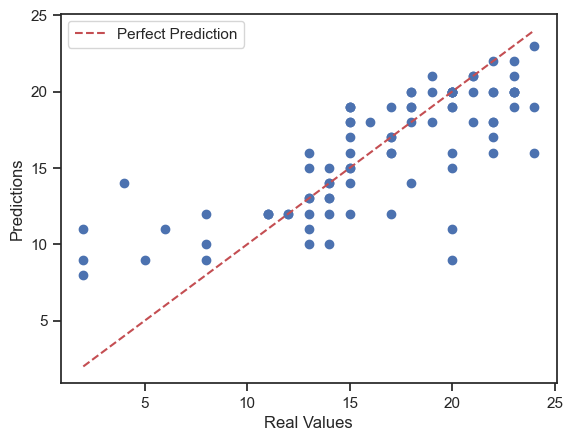

In [169]:
# Comparar valores reales vs predicciones
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', label="Perfect Prediction")
plt.xlabel("Real Values")
plt.ylabel("Predictions")
plt.legend()
plt.show()

In [170]:
# Añadir fila al DataFrame
mmse_results_df = pd.concat([mmse_results_df, pd.DataFrame({
        "ID": 2,
        "Modelo": "Random Forest",
        "MSE": [round(mse, 3)],
        "RMSE": [round(rmse, 3)],
        "MAE": [round(mae, 3)],
        "R2": [round(r2, 3)],
        "RMSE relativo": [round(rmse_relative, 3)]
    })], ignore_index=True)

In [171]:
mmse_results_df

,ID,Modelo,MSE,RMSE,MAE,R2,RMSE relativo
0,1,Decision Tree,20.273,4.503,3.500,0.278,0.205
1,2,Random Forest,11.727,3.425,2.409,0.582,0.156


### 4.3. SVM

In [207]:
# Modelo base de regresión
svr_model = SVR()

# Parámetros
parameters = {
    'C': [0.1, 1, 10],
    'gamma': [0.1, 1, 'scale', 'auto'],
    'kernel': ['linear', 'rbf', 'sigmoid', 'poly']
}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(svr_model, param_grid=parameters, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Guardar el mejor modelo
svr_best_model = grid_search.best_estimator_

# Evaluar el modelo
y_pred = svr_best_model.predict(X_test)
y_pred = np.clip(np.round(svr_best_model.predict(X_test)), 1, 30)


# Métricas de evaluación
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse_relative = rmse / (y_test.max() - y_test.min())

# Resultados
print(f"Mejor parámetro: {grid_search.best_params_}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Relative RMSE: {rmse_relative:.4f}")

Mejor parámetro: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
MAE: 2.3750
MSE: 12.0114
RMSE: 3.4657
R²: 0.5721
Relative RMSE: 0.1575


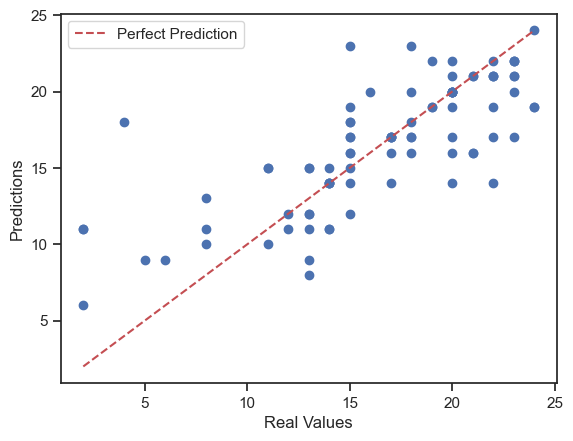

In [208]:
# Comparar valores reales vs predicciones
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', label="Perfect Prediction")
plt.xlabel("Real Values")
plt.ylabel("Predictions")
plt.legend()
plt.show()

In [177]:
# Añadir fila al DataFrame
mmse_results_df = pd.concat([mmse_results_df, pd.DataFrame({
        "ID": 3,
        "Modelo": "SVR",
        "MSE": [round(mse, 3)],
        "RMSE": [round(rmse, 3)],
        "MAE": [round(mae, 3)],
        "R2": [round(r2, 3)],
        "RMSE relativo": [round(rmse_relative, 3)]
    })], ignore_index=True)

In [178]:
mmse_results_df

,ID,Modelo,MSE,RMSE,MAE,R2,RMSE relativo
0,1,Decision Tree,20.273,4.503,3.500,0.278,0.205
1,2,Random Forest,11.727,3.425,2.409,0.582,0.156
2,3,SVR,12.011,3.466,2.375,0.572,0.158


### 4.4. K-Nearest Neighbors

In [179]:
# Modelo de regresión KNN
knn_model = KNeighborsRegressor()

# Parámetros
parameters = {'n_neighbors': [3, 5, 6, 7, 8, 9, 10]}

# Ajuste con GridSearchCV para regresión
grid_search = GridSearchCV(knn_model, param_grid=parameters, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Mejor modelo
knn_best_model = grid_search.best_estimator_

# Predicción
y_pred = knn_best_model.predict(X_test)
y_pred = np.clip(np.round(knn_best_model.predict(X_test)), 1, 30)


# Evaluación del modelo
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
rmse_relative = rmse / (y_test.max() - y_test.min())

# Resultados
print(f"Mejor parámetro: {grid_search.best_params_}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Relative RMSE: {rmse_relative:.4f}")

Mejor parámetro: {'n_neighbors': 6}
MAE: 2.6250
MSE: 13.2841
RMSE: 3.6447
R²: 0.5267
Relative RMSE: 0.1657


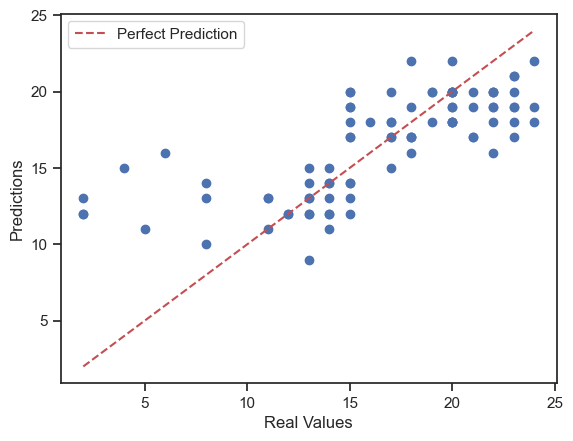

In [180]:
# Comparar valores reales vs predicciones
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', label="Perfect Prediction")
plt.xlabel("Real Values")
plt.ylabel("Predictions")
plt.legend()
plt.show()

In [181]:
# Añadir fila al DataFrame
mmse_results_df = pd.concat([mmse_results_df, pd.DataFrame({
        "ID": 4,
        "Modelo": "KNN",
        "MSE": [round(mse, 3)],
        "RMSE": [round(rmse, 3)],
        "MAE": [round(mae, 3)],
        "R2": [round(r2, 3)],
        "RMSE relativo": [round(rmse_relative, 3)]
    })], ignore_index=True)

In [182]:
mmse_results_df

,ID,Modelo,MSE,RMSE,MAE,R2,RMSE relativo
0,1,Decision Tree,20.273,4.503,3.500,0.278,0.205
1,2,Random Forest,11.727,3.425,2.409,0.582,0.156
2,3,SVR,12.011,3.466,2.375,0.572,0.158
3,4,KNN,13.284,3.645,2.625,0.527,0.166


### 4.5. Ridge Regression

In [183]:
# Modelo base
ridge_model = Ridge()

# Parámetros
parameters = {'alpha': [0.01, 0.1, 1, 10, 100]}

# GridSearchCV
grid_search = GridSearchCV(ridge_model, param_grid=parameters, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Guardar el mejor modelo
ridge_best_model = grid_search.best_estimator_

# Predicciones
y_pred = ridge_best_model.predict(X_test)
y_pred = np.clip(np.round(ridge_best_model.predict(X_test)), 1, 30)


# Métricas
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
rmse_relative = rmse / (y_test.max() - y_test.min())

print(f'Ridge Regression:')
print(f'Best alpha: {grid_search.best_params_["alpha"]}')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Relative RMSE: {rmse_relative:.4f}")

Ridge Regression:
Best alpha: 100
MAE: 3.1023
MSE: 16.3068
RMSE: 4.0382
R²: 0.4190
Relative RMSE: 0.1836


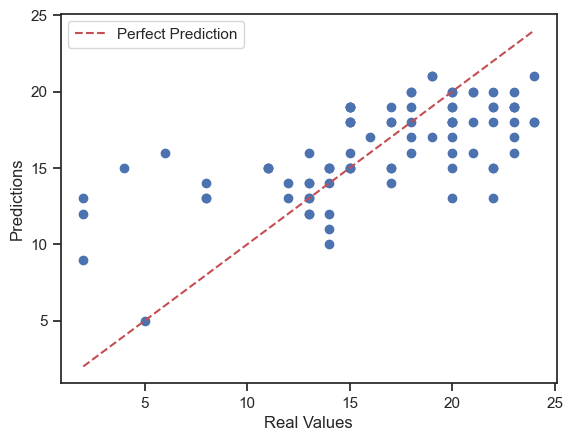

In [184]:
# Comparar valores reales vs predicciones
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', label="Perfect Prediction")
plt.xlabel("Real Values")
plt.ylabel("Predictions")
plt.legend()
plt.show()

In [185]:
# Añadir fila al DataFrame
mmse_results_df = pd.concat([mmse_results_df, pd.DataFrame({
        "ID": 5,
        "Modelo": "Ridge Regression",
        "MSE": [round(mse, 3)],
        "RMSE": [round(rmse, 3)],
        "MAE": [round(mae, 3)],
        "R2": [round(r2, 3)],
        "RMSE relativo": [round(rmse_relative, 3)]
    })], ignore_index=True)

In [186]:
mmse_results_df

,ID,Modelo,MSE,RMSE,MAE,R2,RMSE relativo
0,1,Decision Tree,20.273,4.503,3.500,0.278,0.205
1,2,Random Forest,11.727,3.425,2.409,0.582,0.156
2,3,SVR,12.011,3.466,2.375,0.572,0.158
3,4,KNN,13.284,3.645,2.625,0.527,0.166
4,5,Ridge Regression,16.307,4.038,3.102,0.419,0.184


### 4.6. XGBoost

In [187]:
# Modelo base de regresión
xgb_model = XGBRegressor()

# Parámetros
parameters = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1],
    'max_depth': [3, 5, 7]
}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(xgb_model, param_grid=parameters, cv=5,
                           scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Guardar el mejor modelo
xgb_best_model = grid_search.best_estimator_

# Evaluar el modelo
y_pred = xgb_best_model.predict(X_test)
y_pred = np.clip(np.round(xgb_best_model.predict(X_test)), 1, 30)


mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
rmse_relative = rmse / (y_test.max() - y_test.min())


print(f'XGBoost Regressor:')
print(f'Best Parameters: {grid_search.best_params_}')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Relative RMSE: {rmse_relative:.4f}")

python(15429) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(15430) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(15431) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(15432) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(15433) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(15434) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(15435) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(15436) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


XGBoost Regressor:
Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
MAE: 2.6477
MSE: 13.4432
RMSE: 3.6665
R²: 0.5210
Relative RMSE: 0.1667


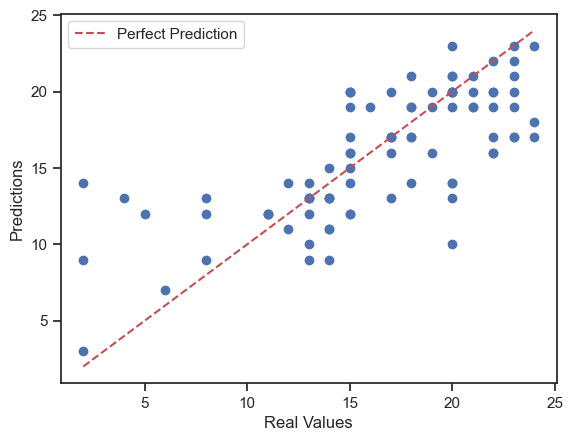

In [188]:
# Comparar valores reales vs predicciones
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', label="Perfect Prediction")
plt.xlabel("Real Values")
plt.ylabel("Predictions")
plt.legend()
plt.show()

In [189]:
# Añadir fila al DataFrame
mmse_results_df = pd.concat([mmse_results_df, pd.DataFrame({
        "ID": 6,
        "Modelo": "XGBoost",
        "MSE": [round(mse, 3)],
        "RMSE": [round(rmse, 3)],
        "MAE": [round(mae, 3)],
        "R2": [round(r2, 3)],
        "RMSE relativo": [round(rmse_relative, 3)]
    })], ignore_index=True)

In [190]:
mmse_results_df

,ID,Modelo,MSE,RMSE,MAE,R2,RMSE relativo
0,1,Decision Tree,20.273,4.503,3.500,0.278,0.205
1,2,Random Forest,11.727,3.425,2.409,0.582,0.156
2,3,SVR,12.011,3.466,2.375,0.572,0.158
3,4,KNN,13.284,3.645,2.625,0.527,0.166
4,5,Ridge Regression,16.307,4.038,3.102,0.419,0.184
5,6,XGBoost,13.443,3.666,2.648,0.521,0.167


### 4.7. CatBoost

In [209]:
# Modelo base de regresión
cat_model = CatBoostRegressor(verbose=0)

# Parámetros
parameters = {
    'iterations': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(cat_model, param_grid=parameters, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Guardar el mejor modelo
cat_best_model = grid_search.best_estimator_

# Evaluar el modelo
y_pred = cat_best_model.predict(X_test)
y_pred = np.clip(np.round(cat_best_model.predict(X_test)), 1, 30)


mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
rmse_relative = rmse / (y_test.max() - y_test.min())


print(f'CatBoost Regressor:')
print(f'Best Parameters: {grid_search.best_params_}')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Relative RMSE: {rmse_relative:.4f}")

CatBoost Regressor:
Best Parameters: {'iterations': 200, 'learning_rate': 0.1}
MAE: 2.2841
MSE: 11.2159
RMSE: 3.3490
R²: 0.6004
Relative RMSE: 0.1522


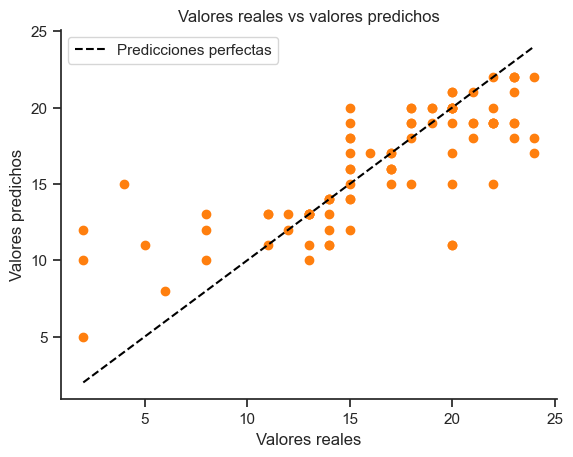

In [210]:
# Comparar valores reales vs predicciones
plt.scatter(y_test, y_pred, color="#ff7f0e")
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='black', label="Predicciones perfectas")
plt.xlabel("Valores reales")
plt.ylabel("Valores predichos")
plt.title("Valores reales vs valores predichos")
plt.legend()
# Guardar como PNG
plt.savefig("./Figuras/realesvspred_mmse.png", dpi=500)
plt.show()

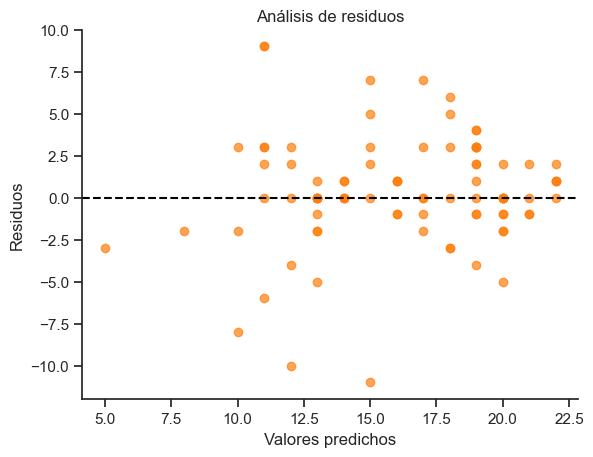

In [211]:
residuos = y_test - y_pred

# Gráfico de residuos
#plt.figure(figsize=(7, 5))
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.scatter(y_pred, residuos, color="#ff7f0e", alpha=0.7)
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel("Valores predichos")
plt.ylabel("Residuos")
plt.title("Análisis de residuos")
plt.grid(False)
# Guardar como PNG
plt.savefig("./Figuras/residuos_mmse.png", dpi=500)
plt.show()

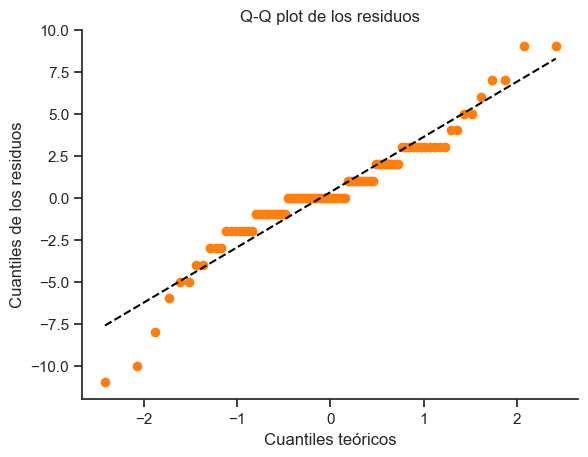

In [212]:
# Distribución de los residuos
fig = plt.figure()
ax = fig.add_subplot(111)

osm, osr = stats.probplot(residuos, dist="norm", plot=ax)

line = ax.get_lines()[1]
line.set_color('black')
line.set_linestyle('--')

points = ax.get_lines()[0]
points.set_markerfacecolor("#ff7f0e")
points.set_markeredgecolor("#ff7f0e")

ax.set_title("Q-Q plot de los residuos")
ax.set_xlabel("Cuantiles teóricos")
ax.set_ylabel("Cuantiles de los residuos")
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.grid(False)
# Guardar como PNG
plt.savefig("./Figuras/qq_mmse.png", dpi=500)
plt.show()

In [213]:
# Test de Shapiro-Wilk
_, p_value = shapiro(residuos)

print(f"p-valor: {p_value:.4f}")

if p_value > 0.05:
    print("No se rechaza la hipótesis nula: los residuos parecen seguir una distribución normal.")
else:
    print("Se rechaza la hipótesis nula: los residuos no parecen seguir una distribución normal.")

p-valor: 0.0004
Se rechaza la hipótesis nula: los residuos no parecen seguir una distribución normal.


In [193]:
# Añadir fila al DataFrame
mmse_results_df = pd.concat([mmse_results_df, pd.DataFrame({
        "ID": 7,
        "Modelo": "CatBoost",
        "MSE": [round(mse, 3)],
        "RMSE": [round(rmse, 3)],
        "MAE": [round(mae, 3)],
        "R2": [round(r2, 3)],
        "RMSE relativo": [round(rmse_relative, 3)]
    })], ignore_index=True)

In [194]:
mmse_results_df

,ID,Modelo,MSE,RMSE,MAE,R2,RMSE relativo
0,1,Decision Tree,20.273,4.503,3.500,0.278,0.205
1,2,Random Forest,11.727,3.425,2.409,0.582,0.156
2,3,SVR,12.011,3.466,2.375,0.572,0.158
3,4,KNN,13.284,3.645,2.625,0.527,0.166
4,5,Ridge Regression,16.307,4.038,3.102,0.419,0.184
5,6,XGBoost,13.443,3.666,2.648,0.521,0.167
6,7,CatBoost,11.216,3.349,2.284,0.600,0.152


In [195]:
# Guardar los resultados
mmse_results_df.to_csv("mmse_results.csv", index=False)

## 5. Interpretabilidad del modelo

Se considera un **RMSE relativo** bajo y que por tanto el modelo tiene un buen rendimiento si es < 0.1 o 10%.
Entre 0.1 - 0.3 se considera medio y > 0.3 que el modelo no funciona correctamente.

In [196]:
count = y_train[y_train < 14].shape[0]
print(f"Cantidad de pacientes con MMSE menor a 14: {count}")

count = y_train[y_train >= 14].shape[0]
print(f"Cantidad de pacientes con MMSE mayor a 14: {count}")

Cantidad de pacientes con MMSE menor a 14: 70
Cantidad de pacientes con MMSE mayor a 14: 192


In [197]:
# Cargar el archivo CSV con los id de las proteinas
archivo_csv = 'protein_id_df.csv'
protein_df = pd.read_csv(archivo_csv)

protein_df

,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,1,NM_024548.2,IOH27601,Q8IW35,LRRIQ2,leucine-rich repeats and IQ motif containing 2...
1,2,BC011414.1,IOH9720,Q9NRY5,C5orf3,chromosome 5 open reading frame 3 (C5orf3)
2,3,BC004932.1,IOH5521,Q9BSN7,C16orf30,chromosome 16 open reading frame 30 (C16orf30)
3,4,BC037854.1,IOH27633,O14576,DYNC1I1,"dynein, cytoplasmic 1, intermediate chain 1 (D..."
4,5,BC051687.1,IOH26538,P57682,KLF3,Kruppel-like factor 3 (basic) (KLF3)
...,...,...,...,...,...,...
9091,9476,NM_002939.3,IOH25734,P13489,RNH1,Ribonuclease inhibitor
9092,9477,NM_153500.1,IOH37934,A8K7Q7,CAMKK2,calcium/calmodulin-dependent protein kinase ki...
9093,9478,NM_001017973.1,IOH26049,O15460,P4HA2,Prolyl 4-hydroxylase subunit alpha-2
9094,9479,NM_001014291.1,IOH57344,Q9BYE4,SPRR2G,Small proline-rich protein 2G


### CatBoost

In [201]:
# Mostrar la importancia de las variables
importance = cat_best_model.feature_importances_
cat_importance_df = pd.DataFrame({'Feature': X_final.columns, 'Importance': importance})
cat_importance_df = cat_importance_df.sort_values(by='Importance', ascending=False)
cat_importance_df['Feature'] = cat_importance_df['Feature'].astype('int64')

cat_importance_df

,Feature,Importance
1,9217,15.894475
21,8050,6.144194
2,8586,5.673649
4,8172,5.425390
6,8838,4.884449
25,8738,4.813520
3,5,4.068527
17,8837,4.065770
13,7816,4.018776
20,8426,3.237857


In [202]:
# Unir la información basada en la columna 'Feature' y 'ID_number'
cat_importance_merged = cat_importance_df.merge(protein_df, left_on='Feature', right_on='ID', how='left')

cat_importance_merged = cat_importance_merged.drop_duplicates(subset='Gene Symbol', keep='first')

cat_importance_merged

,Feature,Importance,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,9217,15.894475,NaN,NaN,NaN,NaN,NaN,NaN
1,8050,6.144194,8050.0,BC011792.1,IOH13815,Q13011,ECH1,"enoyl Coenzyme A hydratase 1, peroxisomal (ECH1)"
2,8586,5.673649,8586.0,NM_002725.1,IOH21892,P51888,PRELP,proline/arginine-rich end leucine-rich repeat ...
3,8172,5.425390,8172.0,NM_001161.3,IOH5534,P50583,NUDT2,nudix (nucleoside diphosphate linked moiety X)...
4,8838,4.884449,8838.0,BC003070.1,IOH4586,P23771,GATA3,Trans-acting T-cell-specific transcription fac...
5,8738,4.813520,8738.0,NM_004236.1,IOH13834,P61201,COPS2,COP9 constitutive photomorphogenic homolog sub...
6,5,4.068527,5.0,BC051687.1,IOH26538,P57682,KLF3,Kruppel-like factor 3 (basic) (KLF3)
8,7816,4.018776,7816.0,BC010901.1,IOH13498,Q8WWK9,CKAP2,cytoskeleton associated protein 2 (CKAP2)
10,7268,3.081415,7268.0,BC028123.1,IOH11565,Q8N6V7,LOC100129827,"cDNA clone MGC:40177 IMAGE:5167345, complete cds"
11,9026,3.075205,9026.0,NM_024048.2,IOH27955,Q96NS8,C16orf67,hypothetical protein MGC3020 (MGC3020)


In [203]:
cat_importance_merged.loc[cat_importance_merged['Feature'] == 9217, 'Gene Symbol'] = 'EIF2AK2'


cat_importance_merged

,Feature,Importance,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,9217,15.894475,NaN,NaN,NaN,NaN,EIF2AK2,NaN
1,8050,6.144194,8050.0,BC011792.1,IOH13815,Q13011,ECH1,"enoyl Coenzyme A hydratase 1, peroxisomal (ECH1)"
2,8586,5.673649,8586.0,NM_002725.1,IOH21892,P51888,PRELP,proline/arginine-rich end leucine-rich repeat ...
3,8172,5.425390,8172.0,NM_001161.3,IOH5534,P50583,NUDT2,nudix (nucleoside diphosphate linked moiety X)...
4,8838,4.884449,8838.0,BC003070.1,IOH4586,P23771,GATA3,Trans-acting T-cell-specific transcription fac...
5,8738,4.813520,8738.0,NM_004236.1,IOH13834,P61201,COPS2,COP9 constitutive photomorphogenic homolog sub...
6,5,4.068527,5.0,BC051687.1,IOH26538,P57682,KLF3,Kruppel-like factor 3 (basic) (KLF3)
8,7816,4.018776,7816.0,BC010901.1,IOH13498,Q8WWK9,CKAP2,cytoskeleton associated protein 2 (CKAP2)
10,7268,3.081415,7268.0,BC028123.1,IOH11565,Q8N6V7,LOC100129827,"cDNA clone MGC:40177 IMAGE:5167345, complete cds"
11,9026,3.075205,9026.0,NM_024048.2,IOH27955,Q96NS8,C16orf67,hypothetical protein MGC3020 (MGC3020)


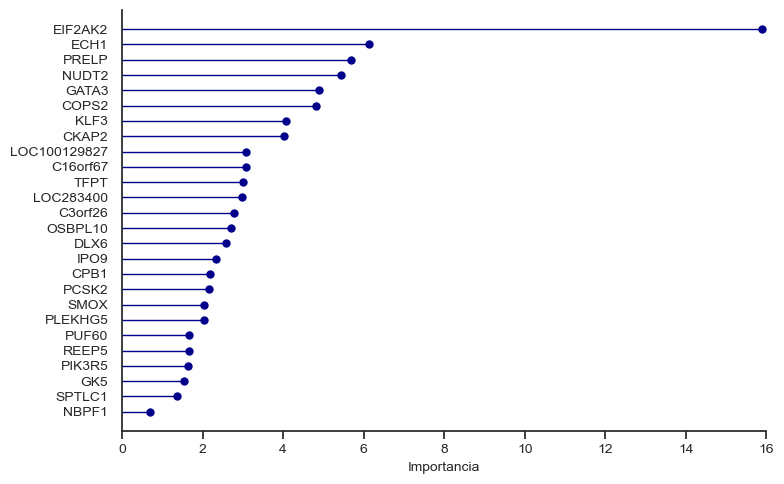

In [205]:
# Ordenar y seleccionar las 20 variables más importantes
df_plot = cat_importance_merged.sort_values(by='Importance', ascending=False)
df_plot = df_plot.dropna(subset=['Gene Symbol'])
df_plot['Gene Symbol'] = df_plot['Gene Symbol'].astype(str)
df_plot = df_plot.iloc[::-1]


# Gráfica
plt.figure(figsize=(8, 5))
sns.set_style("ticks")
plt.tick_params(axis='y', length=0)

plt.hlines(
    y=df_plot['Gene Symbol'],
    xmin=0,
    xmax=df_plot['Importance'],
    color='darkblue',
    linewidth=1)

plt.plot(
    df_plot['Importance'],
    df_plot['Gene Symbol'],
    'o',
    markersize=5,
    color='darkblue')

plt.xlabel('Importancia', fontsize=10)
plt.xlim(0, 16)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tick_params(axis='y', which='major', pad=10)
sns.despine()

plt.grid(False)
plt.tight_layout()

# Guardar como PNG
plt.savefig("./Figuras/variables_mmse_svr.png", dpi=500)

plt.show()

In [206]:
cat_importance_merged.to_csv('29_list_protein.csv', index=False)

/Users/mariam/anaconda3/lib/python3.11/site-packages/pandas/core/internals/blocks.py:2323: RuntimeWarning: invalid value encountered in cast
  values = values.astype(str)
